In [1]:
# PYTHONPATH settings
import sys
sys.path.append("/home/jovyan/lib") 

In [2]:
from mundilib import mundiCatalogue

In [3]:
import matplotlib.pyplot as plt
from PIL import Image

### Service end point - identification

In [4]:
c = mundiCatalogue()
wms = c.getCollection("Sentinel2").mundi_wms()

In [5]:
wms

In [6]:
try:
    print("Type:    " + wms.identification.type)
    print("Version: " + wms.identification.version)
    print("Service: " + wms.identification.title)
    #print("Contents:", list(wms.contents))
except Exception as e:
    print ("----- Error occured -----\n" + str(e))

Type:    WMS
Version: 1.3.0
Service: Sentinel 2


In [7]:
wms.identification.abstract

'The Copernicus project’s Sentinel satellites are revolutionizing earth observation (EO). Its free, full and open access to data with very short revisit times, high spatial resolution, and good spectral resolution are crucial for many applications. The portfolio of possible products is vast - use-cases of such a service range from plant health monitoring, land and water body change, flood monitoring, disaster mapping and more.However the current gap between Sentinel source data and its end-users is large:• \x90  ESA’s complex Scientific Data Hub• \x90  raster files are compressed with JPEG2000 (13 raster filesfor each product, one per spectral band)• \x90  terabytes of data per week• \x90  additional processing requirementsTackling the data in an old-fashioned way -  offering individual derivative products simply does not work anymore, the associated time and costs are large and defeat most of the major benefits of the Sentinel project.Our approach combines cloud-based GIS technologies

In [8]:
for op in wms.operations:
    print (op.name + str(wms.getOperationByName(op.name).methods))
    
    try :
        for fm in wms.getOperationByName(op.name).formatOptions:
            print ("\t" + fm)
        print ("")
    
    except Exception as e:
        print ("\n----- Error occured -----\n" + str(e) + "\n")

GetCapabilities[{'type': 'Get', 'url': 'http://shservices.mundiwebservices.com/ogc/wms/d275ef59-3f26-4466-9a60-ff837e572144?'}]
	application/xml
	text/xml
	application/vnd.ogc.wms_xml

GetMap[{'type': 'Get', 'url': 'http://shservices.mundiwebservices.com/ogc/wms/d275ef59-3f26-4466-9a60-ff837e572144?'}]
	image/png
	image/jpeg
	image/jpg
	image/tiff
	application/vnd.google-earth.kmz+xml
	image/tiff;depth=8
	image/tiff;depth=16
	image/tiff;depth=32f
	application/vnd.google-earth.kmz+xml;image_type=image/jpeg
	application/vnd.google-earth.kmz+xml;image_type=image/png
	application/x-esri-shape
	application/json

GetFeatureInfo[{'type': 'Get', 'url': 'http://shservices.mundiwebservices.com/ogc/wms/d275ef59-3f26-4466-9a60-ff837e572144?'}]
	application/xml
	text/xml
	application/vnd.ogc.wms_xml
	application/vnd.ogc.gml
	text/html
	application/json
	text/plain



#### Available layers and attributes

In [9]:
layers = list(wms.contents)
for lay in layers:
    print (wms[lay].name + " i.e. " + "'" + wms[lay].title + "'")

1_NATURAL_COL0R i.e. 'Natural color'
CUSTOM-NDVI i.e. 'Custom_NDVI'
2_COLOR_INFRARED__VEGETATION_ i.e. 'Color Infrared (vegetation)'
3_FALSE_COLOR__URBAN_ i.e. 'False color (urban)'
4_AGRICULTURE i.e. 'Agriculture'
5_VEGETATION_INDEX i.e. 'Vegetation Index'
6_MOISTURE_INDEX i.e. 'Moisture Index'
7_GEOLOGY i.e. 'Geology'
8_BATHYMETRIC i.e. 'Bathymetric'
90_ATMOSPHERIC_PENETRATION i.e. 'Atmospheric penetration'
91_SWIR i.e. 'SWIR'
92_NDWI i.e. 'NDWI'
93-SWIR-2-11-12 i.e. 'SWIR-2,11,12'
B01 i.e. 'B01'
B02 i.e. 'B02'
B03 i.e. 'B03'
B04 i.e. 'B04'
B05 i.e. 'B05'
B06 i.e. 'B06'
B07 i.e. 'B07'
B08 i.e. 'B08'
B09 i.e. 'B09'
B10 i.e. 'B10'
B11 i.e. 'B11'
B12 i.e. 'B12'
B8A i.e. 'B8A'


#### Details of a WMS layer

In [10]:
layer = wms[layers[0]]
#print (layer.queryable)
#print (layer.children)
print("Name:", layer.name)
print("Title: ", layer.parent.title)
print("Abstract: ", layer.abstract)
print("BBox: ", layer.boundingBoxWGS84)
print("CRS: ", layer.crsOptions)
#print("Styles: ", layer.styles)
print("Timestamps: ", layer.timepositions)

Name: 1_NATURAL_COL0R
Title:  Sentinel Hub WMS
Abstract:  Based on bands 4,3,2
BBox:  (-180.0, -90.0, 180.0, 90.0)
CRS:  ['EPSG:3416', 'EPSG:32658', 'EPSG:32741', 'EPSG:3912', 'EPSG:3857', 'EPSG:2154', 'EPSG:4326', 'EPSG:32652', 'EPSG:32718', 'EPSG:32649', 'EPSG:32714', 'EPSG:32740', 'EPSG:32619', 'EPSG:32703', 'EPSG:32616', 'EPSG:32715', 'EPSG:32609', 'EPSG:32650', 'EPSG:32716', 'EPSG:32644', 'EPSG:32634', 'EPSG:32625', 'EPSG:32756', 'EPSG:32635', 'EPSG:32605', 'EPSG:32638', 'EPSG:32613', 'EPSG:32608', 'EPSG:32628', 'EPSG:32721', 'EPSG:32710', 'EPSG:32617', 'EPSG:32755', 'EPSG:3004', 'EPSG:32723', 'EPSG:32651', 'SR-ORG:98739', 'EPSG:32657', 'EPSG:27700', 'EPSG:32647', 'EPSG:32626', 'EPSG:32654', 'EPSG:32614', 'EPSG:32630', 'EPSG:3765', 'EPSG:32720', 'EPSG:32729', 'EPSG:32749', 'EPSG:32752', 'EPSG:32704', 'EPSG:32728', 'EPSG:32629', 'EPSG:32615', 'EPSG:32646', 'EPSG:32722', 'EPSG:32742', 'EPSG:32725', 'EPSG:32604', 'EPSG:32706', 'EPSG:32607', 'EPSG:32754', 'EPSG:32636', 'EPSG:32743', '

#### Available operations with offered output format

In [11]:
#[op.name for op in wms.operations]
for op in wms.operations:
    print (op.name + str(wms.getOperationByName(op.name).methods))
    
    try :
        for fm in wms.getOperationByName(op.name).formatOptions:
            print ("\t" + fm)
        print ("")
    
    except Exception as e:
        print ("\n----- Error occured -----\n" + str(e) + "\n")

GetCapabilities[{'type': 'Get', 'url': 'http://shservices.mundiwebservices.com/ogc/wms/d275ef59-3f26-4466-9a60-ff837e572144?'}]
	application/xml
	text/xml
	application/vnd.ogc.wms_xml

GetMap[{'type': 'Get', 'url': 'http://shservices.mundiwebservices.com/ogc/wms/d275ef59-3f26-4466-9a60-ff837e572144?'}]
	image/png
	image/jpeg
	image/jpg
	image/tiff
	application/vnd.google-earth.kmz+xml
	image/tiff;depth=8
	image/tiff;depth=16
	image/tiff;depth=32f
	application/vnd.google-earth.kmz+xml;image_type=image/jpeg
	application/vnd.google-earth.kmz+xml;image_type=image/png
	application/x-esri-shape
	application/json

GetFeatureInfo[{'type': 'Get', 'url': 'http://shservices.mundiwebservices.com/ogc/wms/d275ef59-3f26-4466-9a60-ff837e572144?'}]
	application/xml
	text/xml
	application/vnd.ogc.wms_xml
	application/vnd.ogc.gml
	text/html
	application/json
	text/plain



In [12]:
for d in dir(wms):
    if "_" not in d:
        print (d)

contents
exceptions
getOperationByName
getServiceXML
getfeatureinfo
getmap
headers
identification
items
operations
password
provider
request
timeout
updateSequence
url
username
version


### Usage

#### Used parameters

In [13]:
from mundilib import width, height

_projection_ = 'EPSG:3857' 
_bbox_       = (146453.3462,5397218.5672,176703.3001,5412429.5358) # Toulouse
_time_       = '2018-04-21/2018-04-21'

_height_     = 300
_width_      = width(_bbox_, _height_)

#_width = 600
#_height = height(_bbox, _width)

#### 'GetMap' --- Visualisation of all WMS layers from bbox of Toulouse

Natural color


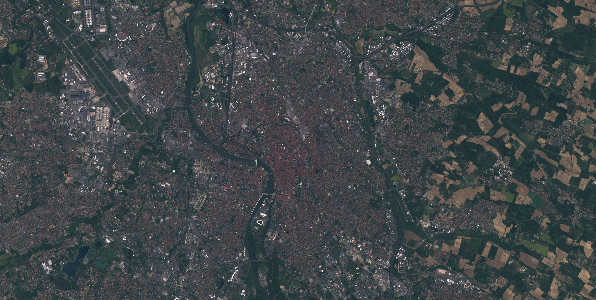

Custom_NDVI


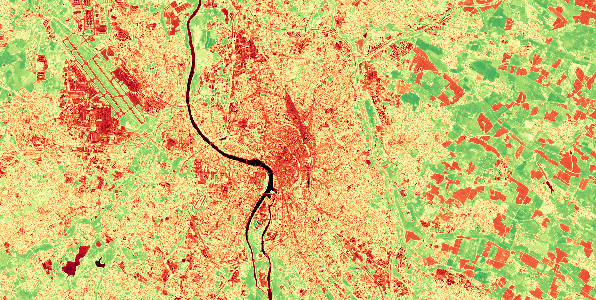

Color Infrared (vegetation)


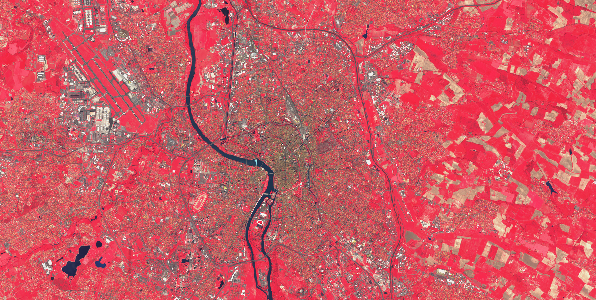

False color (urban)


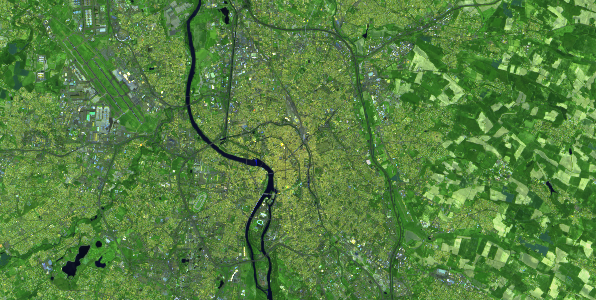

Agriculture


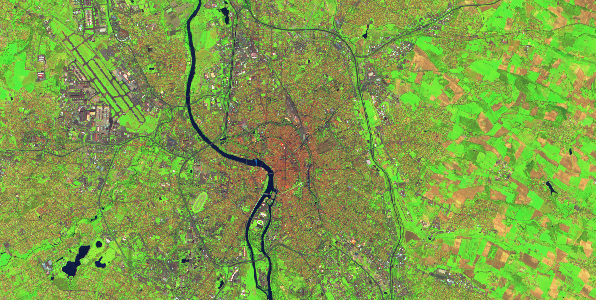

Vegetation Index


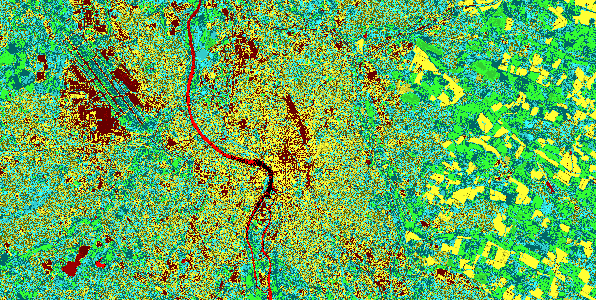

Moisture Index


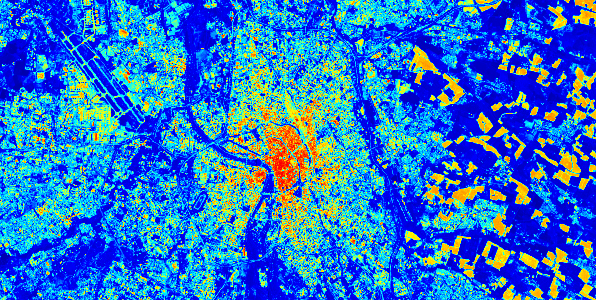

Geology


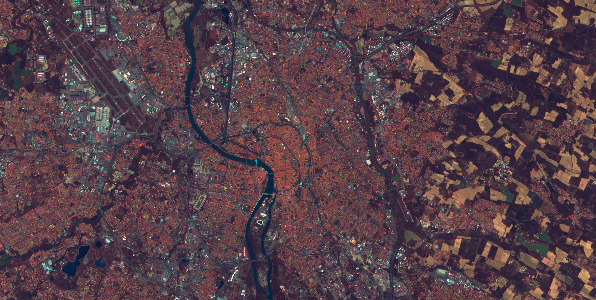

Bathymetric


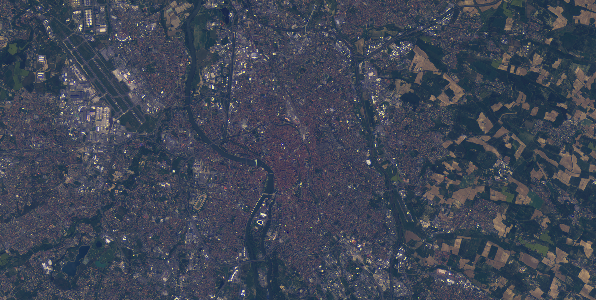

Atmospheric penetration


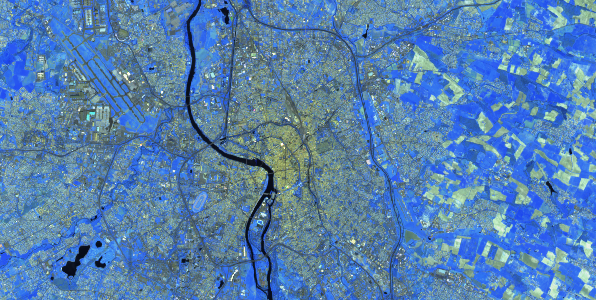

SWIR


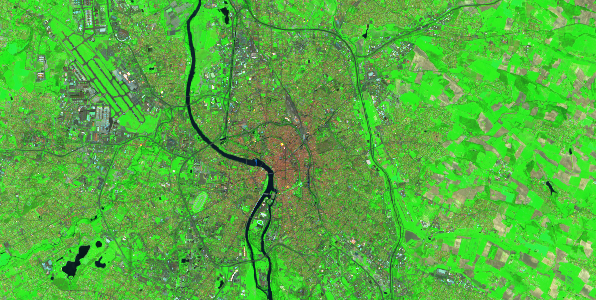

NDWI


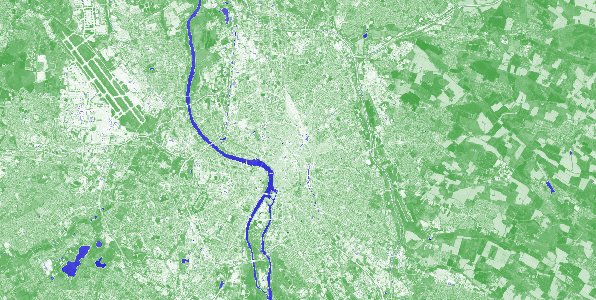

SWIR-2,11,12


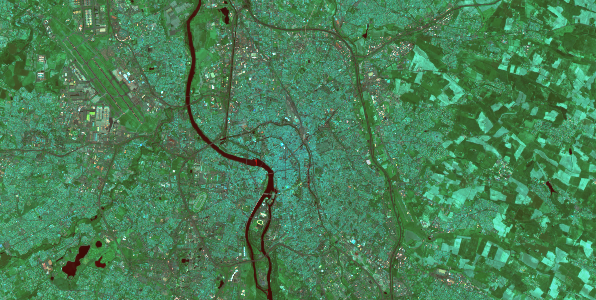

B01


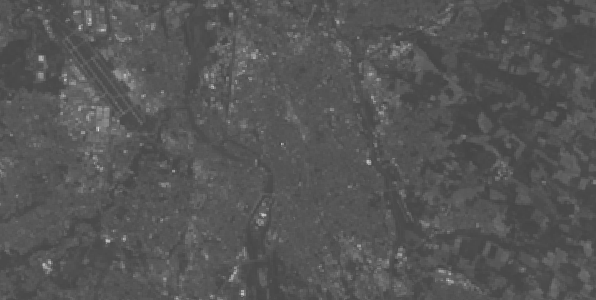

B02


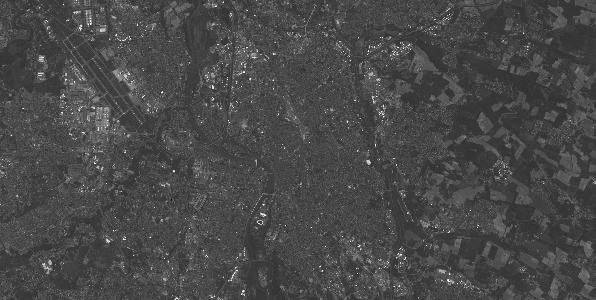

B03


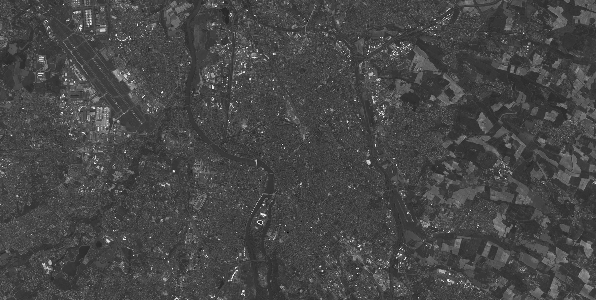

B04


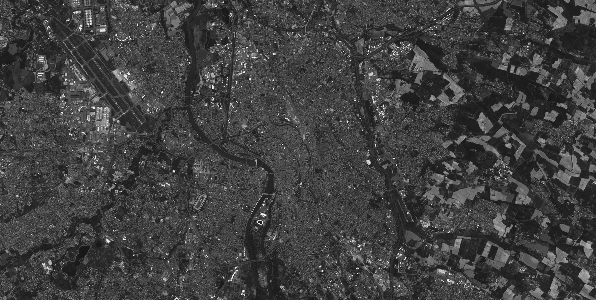

B05


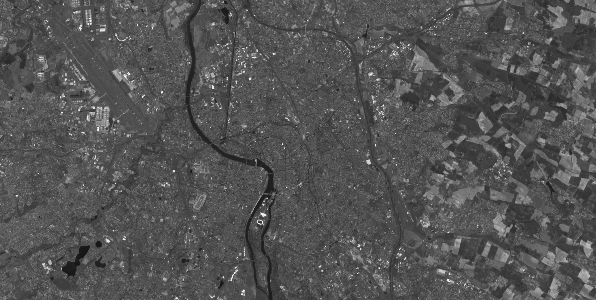

B06


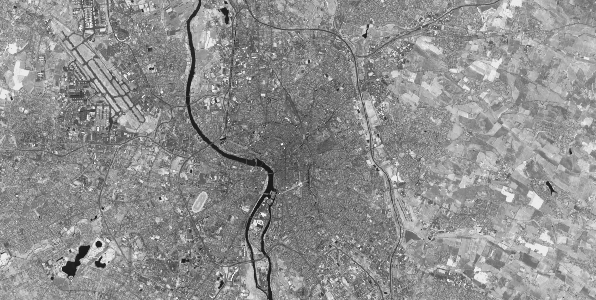

B07


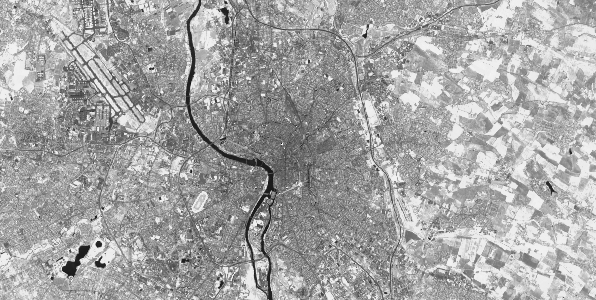

B08


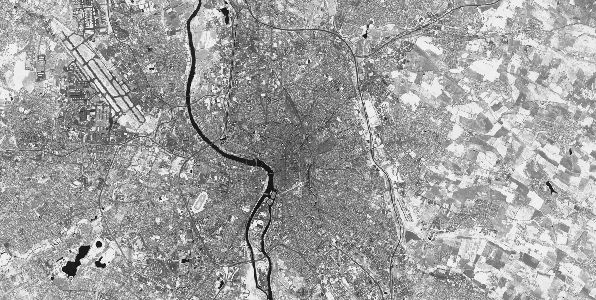

B09


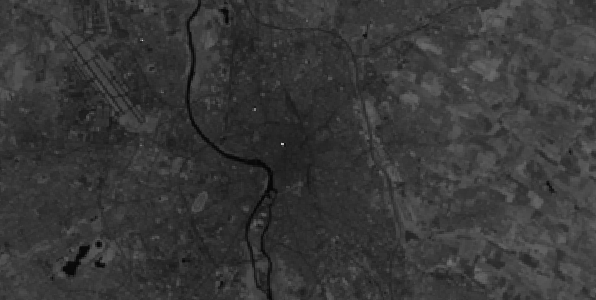

B10


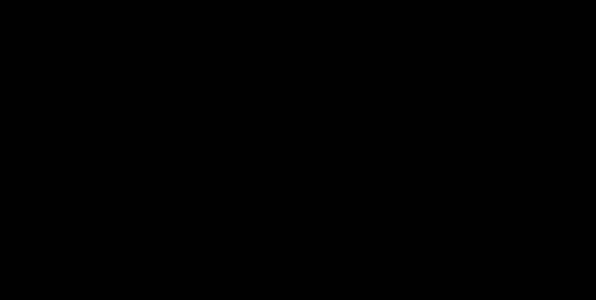

B11


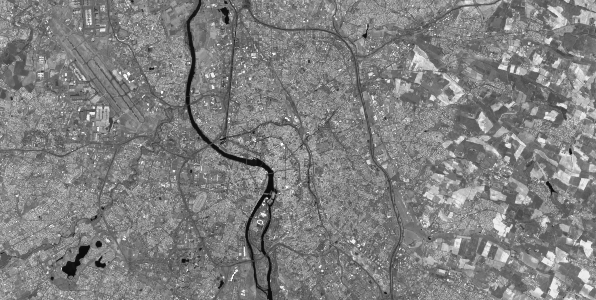

B12


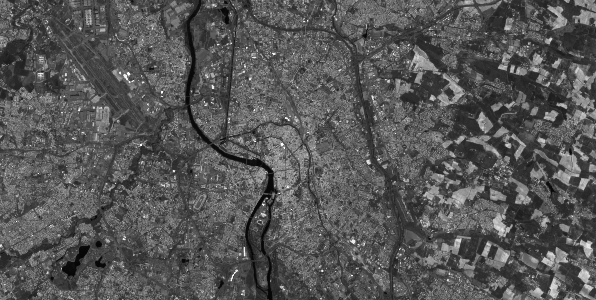

B8A


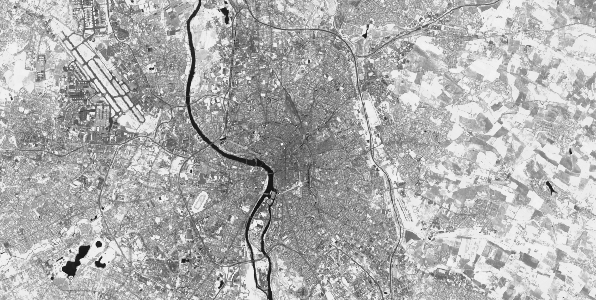

In [14]:
layers = list(wms.contents)

for lay in layers:

    print (wms[lay].title)

    # getting image from 'wms'
    img = wms.getmap(layers = [wms[lay].name],
                             srs = _projection_,
                             bbox = _bbox_,
                             size = (_width_, _height_),
                             format ='image/png',
                             time = _time_,
                             showlogo = False,
                             transparent=False)
    
    # writing image
    #path = 'output_images/' + wms[lay].name + '.png'
    #out = open(path, 'wb')     
    #out.write(response.read())
    #out.close()
    
    display(Image.open(img))

#### Visualisation of offered formats for specific layer

image/png


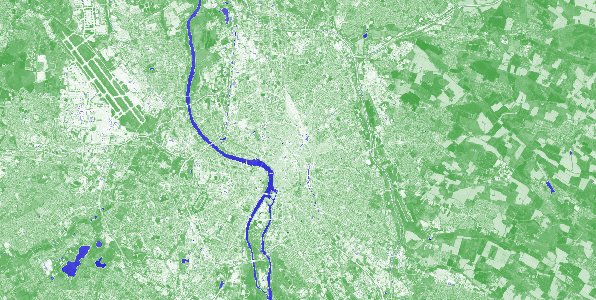

image/jpeg


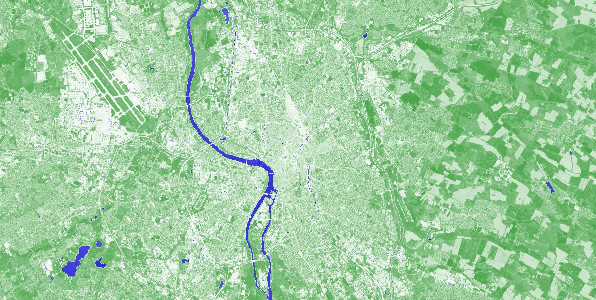

image/jpg


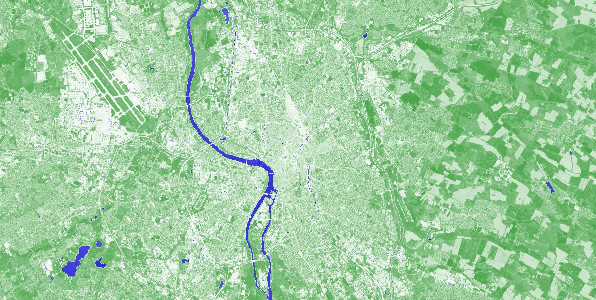

image/tiff


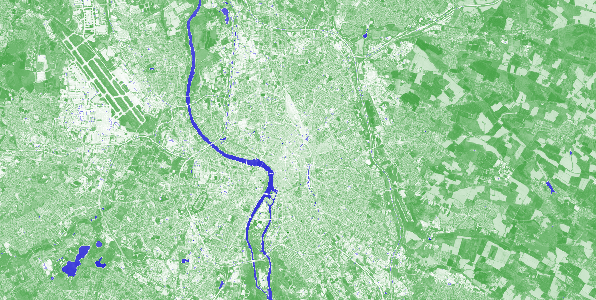

application/vnd.google-earth.kmz+xml
image/tiff;depth=8


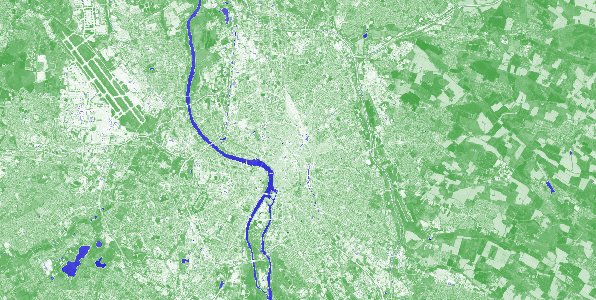

image/tiff;depth=16


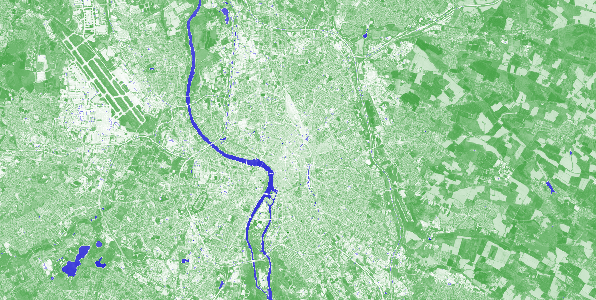

image/tiff;depth=32f
----- Error occured -----
cannot identify image file <_io.BytesIO object at 0x7f653f0b7d00>


In [15]:
# getting one image on a given layer in available image formats
try:
    formats = wms.getOperationByName('GetMap').formatOptions
    for fmt in formats:
        print (fmt)
           
        # getting image from 'wms'
        img = wms.getmap(
                            layers      = [wms[layers[11]].name],
                            srs         = _projection_,
                            bbox        = _bbox_,
                            size        = (_width_, _height_),
                            format      = str(fmt),
                            time        = _time_,
                            showlogo    = False,
                            transparent = False
        )
        
        if (str(fmt)[:5] == "image"):
            display(Image.open(img))

except Exception as e:
    print ("----- Error occured -----\n" + str(e))

#### 'GetFeatureInfo' --- Info in HTML output format

In [16]:
# GetFeatureInfo (text/html)
response = wms.getfeatureinfo(
                                layers      = ['B04'],
                                srs         = _projection_,
                                bbox        = _bbox_,
                                size        = (_width_, _height_),
                                info_format = "text/html",
                                xy          = (250,250)
)

# writing html file
#out = open('output_data/getfeatureinfo-response.html', 'wb')
#out.write(response.read())
#out.close()
        
html = str(response.read()).replace('\\r\\n', '')
html = html.replace('b\'', '')

from IPython.core.display import HTML
display(HTML(html))

id,date,time,path,crs,mbr,out1
S2B_OPER_MSI_L1C_TL_SGS__20181112T125827_A008800_T31TCJ_N02.07,2018-11-12,10:58:56,https://obs.eu-de.otc.t-systems.com/s2-l1c-2018-q4/31/T/CJ/2018/11/12/S2B_MSIL1C_20181112T105259_N0207_R051_T31TCJ_20181112T125827/GRANULE/L1C_T31TCJ_A008800_20181112T105301/IMG_DATA/T31TCJ_20181112T105259_,EPSG:32631,"300000,4790220 409800,4900020",0.189
